# CycleGAN, Image-to-Image Translation

In this notebook, we're going to define and train a CycleGAN to read in an image from a set $X$ and transform it so that it looks as if it belongs in set $Y$. Specifically, we'll look at a set of images of [Monet paintings](https://www.claudemonetgallery.org/)

>The objective will be to train generators that learn to transform an image from domain $X$ into an image that looks like it came from domain $Y$ (and vice versa). 

### Unpaired Training Data

These images do not come with labels, but CycleGANs give us a way to learn the mapping between one image domain and another using an **unsupervised** approach. A CycleGAN is designed for image-to-image translation and it learns from unpaired training data. This means that in order to train a generator to translate images from domain $X$ to domain $Y$, we do not have to have exact correspondences between individual images in those domains. For example, in [the paper that introduced CycleGANs](https://arxiv.org/abs/1703.10593), the authors are able to translate between images of horses and zebras, even though there are no images of a zebra in exactly the same position as a horse or with exactly the same background, etc. Thus, CycleGANs enable learning a mapping from one domain $X$ to another domain $Y$ without having to find perfectly-matched, training pairs!

<img src='assets/horse2zebra.jpg' width=50% />

### CycleGAN Structure

A CycleGAN is made of two types of networks: **discriminators, and generators**. The discriminators are responsible for classifying images as real or fake (for both $X$ and $Y$ kinds of images). The generators are responsible for generating convincing, fake images for both kinds of images.


---

## Load and Visualize the Data

In [1]:
# !unzip monet2photo.zip # can comment out after executing once

In [2]:
# loading in and transforming data
import os
import torch
from torch.utils.data import DataLoader
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms

# visualizing data
import matplotlib.pyplot as plt
import numpy as np
import warnings

%matplotlib inline

### DataLoaders

The `get_data_loader` function returns training and test DataLoaders that can load data efficiently and in specified batches. The function has the following parameters:
* `image_type`: `A` or `B`,  the names of the directories where the X and Y images are stored
* `image_dir`: name of the main image directory, which holds all training and test images
* `image_size`: resized, square image dimension (all images will be resized to this dim)
* `batch_size`: number of images in one batch of data

The test data is strictly for feeding to our generators, later on, so we can visualize some generated samples on fixed, test data.

This function is also responsible for making sure our images are of the right, square size (128x128x3) and converted into Tensor image types.

In [3]:
def get_data_loader(image_type, image_dir, 
                    image_size=128, batch_size=16, 
                    num_workers=0):
    '''
    Returns training and test data loaders for a given image type, either 'summer' or 'winter'. 
    These images will be resized to 128x128x3, by default, converted into Tensors, and normalized.
    '''
    
    # resize and normalize the images
    transform = transforms.Compose([transforms.Resize(image_size), # resize to image_size x image_size
                                    transforms.ToTensor()])

    # get training and test directories
    image_path = f'./{image_dir}'
    train_path = os.path.join(image_path, f'train{image_type}')
    test_path = os.path.join(image_path, f'test{image_type}')

    # define datasets using ImageFolder
    train_dataset = datasets.ImageFolder(train_path, transform)
    test_dataset = datasets.ImageFolder(test_path, transform)

    # create and return DataLoaders
    train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
    test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

    return train_loader, test_loader

In [4]:
image_dir = 'monet2photo/'
batch_size = 16

dataloader_X, test_dataloader_X = get_data_loader(image_type='A', image_dir=image_dir, batch_size=batch_size)
dataloader_Y, test_dataloader_Y = get_data_loader(image_type='B', image_dir=image_dir, batch_size=batch_size)

## Display some Training Images

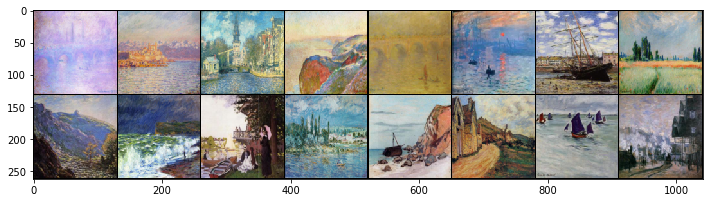

In [5]:
# helper imshow function
def imshow(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    

# get some images from X
dataiter = iter(dataloader_X)
images, _ = dataiter.next()

# show images
fig = plt.figure(figsize=(12, 8))
imshow(torchvision.utils.make_grid(images))

Next, let's visualize a batch of images from set $Y$.

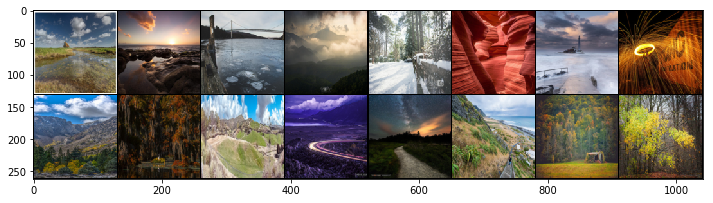

In [6]:
# get some images from Y
dataiter = iter(dataloader_Y)
images, _ = dataiter.next()

# show images
fig = plt.figure(figsize=(12,8))
imshow(torchvision.utils.make_grid(images))

### Pre-processing: scaling from -1 to 1

We need to do a bit of pre-processing; we know that the output of our `tanh` activated generator will contain pixel values in a range from -1 to 1, and so, we need to rescale our training images to a range of -1 to 1. Right now, they are in a range from 0-1.

In [7]:
# current range
img = images[0]

print('Min: ', img.min())
print('Max: ', img.max())

Min:  tensor(1.00000e-02 *
       3.9216)
Max:  tensor(1.)


In [8]:
# helper scale function
def scale(x, feature_range=(-1, 1)):
    '''
    Scale takes in an image x and returns that image, scaled
    with a feature_range of pixel values from -1 to 1. 
    This function assumes that the input x is already scaled from 0-255.
    '''
    
    # scale from 0-1 to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [9]:
# scaled range
scaled_img = scale(img)

print('Scaled min: ', scaled_img.min())
print('Scaled max: ', scaled_img.max())

Scaled min:  tensor(-0.9216)
Scaled max:  tensor(1.)


---
## Define the Model

A CycleGAN is made of two discriminator and two generator networks.

## Discriminators

The discriminators, $D_X$ and $D_Y$, in this CycleGAN are convolutional neural networks that see an image and attempt to classify it as real or fake. In this case, real is indicated by an output close to 1 and fake as close to 0. The discriminators have the following architecture:

<img src='assets/discriminator_layers.png' width=80% />

This network sees a 128x128x3 image, and passes it through 5 convolutional layers that downsample the image by a factor of 2. The first four convolutional layers have a BatchNorm and ReLu activation function applied to their output, and the last acts as a classification layer that outputs one value.

### Convolutional Helper Function

In [10]:
import torch.nn as nn
import torch.nn.functional as F

# helper conv function
def conv(in_channels, out_channels, kernel_size, stride=2, padding=1, batch_norm=True):
    """Creates a convolutional layer, with optional batch normalization.
    """
    layers = []
    conv_layer = nn.Conv2d(in_channels=in_channels, out_channels=out_channels, 
                           kernel_size=kernel_size, stride=stride, padding=padding, bias=False)
    
    layers.append(conv_layer)

    if batch_norm:
        layers.append(nn.BatchNorm2d(out_channels))
    
    return nn.Sequential(*layers)

### Discriminator Architecture

In [11]:
class Discriminator(nn.Module):
    '''Accepts an RGB image as input and output a single value'''
    
    def __init__(self, conv_dim=64):
        super(Discriminator, self).__init__()
        
        self.conf_dim = conv_dim
        
        # 128x128x3
        self.conv1 = conv(in_channels=3, 
                          out_channels=conv_dim, 
                          kernel_size=4, 
                          batch_norm=False)
        # 64x64x64
        self.conv2 = conv(in_channels=conv_dim, 
                          out_channels=conv_dim*2, 
                          kernel_size=4)
        # 32x32x128
        self.conv3 = conv(in_channels=conv_dim*2, 
                          out_channels=conv_dim*4, 
                          kernel_size=4)
        # 16x16x256
        self.conv4 = conv(in_channels=conv_dim*4, 
                          out_channels=conv_dim*8, 
                          kernel_size=4)
        # 8x8x512
        self.conv5 = conv(in_channels=conv_dim*8, 
                          out_channels=1, 
                          kernel_size=4, 
                          stride=1, 
                          batch_norm=False)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        
        out = self.conv5(x)
        
        return out

## Generators

The generators, `G_XtoY` and `G_YtoX` (sometimes called F), are made of an **encoder**, a conv net that is responsible for turning an image into a smaller feature representation, and a **decoder**, a *transpose_conv* net that is responsible for turning that representation into an transformed image. These generators, one from XtoY and one from YtoX, have the following architecture:

<img src='assets/cyclegan_generator_ex.png' width=90% />

This network sees a 128x128x3 image, compresses it into a feature representation as it goes through three convolutional layers and reaches a series of residual blocks. It goes through a few (typically 6 or more) of these residual blocks, then it goes through three transpose convolutional layers (sometimes called *de-conv* layers) which upsample the output of the resnet blocks and create a new image!

Note that most of the convolutional and transpose-convolutional layers have BatchNorm and ReLu functions applied to their outputs with the exception of the final transpose convolutional layer, which has a `tanh` activation function applied to the output. Also, the residual blocks are made of convolutional and batch normalization layers, which we'll go over in more detail, next.

---
### Residual Block Class

To define the generators, we need to first define a `ResidualBlock` class which will help us connect the encoder and decoder portions of the generators. And what exactly is a Resnet block?

<img src='assets/resnet_50.png' width=90%/>

ResNet blocks rely on connecting the output of one layer with the input of an earlier layer. The motivation for this structure is as follows: very deep neural networks can be difficult to train. Deeper networks are more likely to have vanishing or exploding gradients and, therefore, have trouble reaching convergence; batch normalization helps with this a bit. However, during training, we often see that deep networks respond with a kind of training degradation. Essentially, the training accuracy stops improving and gets saturated at some point during training. In the worst cases, deep models would see their training accuracy actually worsen over time!

One solution to this problem is to use **Resnet blocks** that allow us to learn so-called *residual functions* as they are applied to layer inputs. You can read more about this proposed architecture in the paper, [Deep Residual Learning for Image Recognition](https://arxiv.org/pdf/1512.03385.pdf) by Kaiming He et. al, and the below image is from that paper.

<img src='assets/resnet_block.png' width=40%/>

### Residual Functions

Usually, when we create a deep learning model, the model (several layers with activations applied) is responsible for learning a mapping, `M`, from an input `x` to an output `y`.
>`M(x) = y` (Equation 1)

Instead of learning a direct mapping from `x` to `y`, we can instead define a **residual function**
> `F(x) = M(x) - x`

This looks at the difference between a mapping applied to x and the original input, x. `F(x)` is, typically, two convolutional layers + normalization layer and a ReLu in between. These convolutional layers should have the same number of inputs as outputs. This mapping can then be written as the following; a function of the residual function and the input x. The addition step creates a kind of loop that connects the input x to the output, y:
>`M(x) = F(x) + x` (Equation 2) or

>`y = F(x) + x` (Equation 3)

#### Optimizing a Residual Function

The idea is that it is easier to optimize this residual function `F(x)` than it is to optimize the original mapping `M(x)`. Consider an example; what if we want `y = x`?

From our first, direct mapping equation, **Equation 1**, we could set `M(x) = x` but it is easier to solve the residual equation `F(x) = 0`, which, when plugged in to **Equation 3**, yields `y = x`.


### ResidualBlock Class

In [12]:
class ResidualBlock(nn.Module):
    '''
    Defines a residual block.
    This adds an input x to a convolutional layer (applied to x) with the same size input and output.
    These blocks allow a model to learn an effective transformation from one domain to another.
    '''
    
    def __init__(self, conv_dim):
        super(ResidualBlock, self).__init__()

        self.conv1 = conv(in_channels=conv_dim, 
                          out_channels=conv_dim, 
                          kernel_size=3, 
                          stride=1)
        
        self.conv2 = conv(in_channels=conv_dim, 
                          out_channels=conv_dim, 
                          kernel_size=3, 
                          stride=1)
        
    def forward(self, x):
        out = F.relu(self.conv1(x))
        out = x + self.conv2(out)
        
        return out
    

### Transpose Convolutional Helper Function

In [13]:
# helper deconv function
def deconv(in_channels, out_channels, kernel_size, stride=2, padding=1, batch_norm=True):
    '''
    Creates a transpose convolutional layer, with optional batch normalization.
    '''
    
    layers = []
    # append transpose conv layer
    layers.append(nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False))
    # optional batch norm layer
    if batch_norm:
        layers.append(nn.BatchNorm2d(out_channels))
    
    return nn.Sequential(*layers)

---
## Generator Architecture

In [14]:
class CycleGenerator(nn.Module):
    
    def __init__(self, conv_dim=64, n_res_blocks=6):
        super(CycleGenerator, self).__init__()

        # 1. Encoder part of the generator
        
        # 128x128x3
        self.conv1 = conv(in_channels=3, out_channels=conv_dim, kernel_size=4)
        # 64x64x64
        self.conv2 = conv(in_channels=conv_dim, out_channels=conv_dim*2, kernel_size=4)
        # 32x32x128
        self.conv3 = conv(in_channels=conv_dim*2, out_channels=conv_dim*4, kernel_size=4)
        # 16x16x256

        # 2. Resnet part of the generator
        res_layers = []
        for _ in range(n_res_blocks):
            res_layers.append(ResidualBlock(conv_dim*4))
        
        self.res_blocks = nn.Sequential(*res_layers)

        # 3. Decoder part of the generator
        
        # 16x16x256
        self.deconv1 = deconv(in_channels=conv_dim*4, out_channels=conv_dim*2, kernel_size=4)
        # 32x32x128
        self.deconv2 = deconv(in_channels=conv_dim*2, out_channels=conv_dim, kernel_size=4)
        # 64x64x128
        self.deconv3 = deconv(in_channels=conv_dim, out_channels=3, kernel_size=4, batch_norm=False)

    def forward(self, x):
        '''Given an image x, returns a transformed image'''
        
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))
        
        x = self.res_blocks(x)
        
        x = F.relu(self.deconv1(x))
        x = F.relu(self.deconv2(x))
        
        x = F.tanh(self.deconv3(x))

        return x

---
## Complete network

In [15]:
def create_model(g_conv_dim=64, d_conv_dim=64, n_res_blocks=6):
    '''Builds the generators and discriminators'''
    
    G_XtoY = CycleGenerator(g_conv_dim, n_res_blocks)
    G_YtoX = CycleGenerator(g_conv_dim, n_res_blocks)
    
    D_X = Discriminator(d_conv_dim)
    D_Y = Discriminator(d_conv_dim)

    # move models to GPU, if available
    if torch.cuda.is_available():
        device = torch.device("cuda:0")
        G_XtoY.to(device)
        G_YtoX.to(device)
        D_X.to(device)
        D_Y.to(device)
        print('Models moved to GPU.')
    else:
        print('Only CPU available.')

    return G_XtoY, G_YtoX, D_X, D_Y

In [16]:
G_XtoY, G_YtoX, D_X, D_Y = create_model()

Models moved to GPU.


In [17]:
# helper function for printing the model architecture
def print_models(G_XtoY, G_YtoX, D_X, D_Y):
    """Prints model information for the generators and discriminators.
    """
    print("                     G_XtoY                    ")
    print("-----------------------------------------------")
    print(G_XtoY)
    print()

    print("                     G_YtoX                    ")
    print("-----------------------------------------------")
    print(G_YtoX)
    print()

    print("                      D_X                      ")
    print("-----------------------------------------------")
    print(D_X)
    print()

    print("                      D_Y                      ")
    print("-----------------------------------------------")
    print(D_Y)
    print()
    

# print all of the models
print_models(G_XtoY, G_YtoX, D_X, D_Y)

                     G_XtoY                    
-----------------------------------------------
CycleGenerator(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (res_blocks): Sequential(
    (0): ResidualBlock(
      (conv1): Sequential(
        (0): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
 

## Discriminator and Generator Losses

Computing the discriminator and the generator losses are key to getting a CycleGAN to train.

<img src='assets/CycleGAN_loss.png' width=90% height=90% />

**Image from [original paper](https://arxiv.org/abs/1703.10593) by Jun-Yan Zhu et. al.**

* The CycleGAN contains two mapping functions $G: X \rightarrow Y$ and $F: Y \rightarrow X$, and associated adversarial discriminators $D_Y$ and $D_X$. **(a)** $D_Y$ encourages $G$ to translate $X$ into outputs indistinguishable from domain $Y$, and vice versa for $D_X$ and $F$.

* To further regularize the mappings, we introduce two cycle consistency losses that capture the intuition that if
we translate from one domain to the other and back again we should arrive at where we started. **(b)** Forward cycle-consistency loss and **(c)** backward cycle-consistency loss.

## Least Squares GANs

Regular GANs treat the discriminator as a classifier with the sigmoid cross entropy loss function. However, this loss function may lead to the vanishing gradients problem during the learning process. To overcome such a problem, we'll use a least squares loss function for the discriminator. This structure is also referred to as a least squares GAN or LSGAN, and you can [read the original paper on LSGANs, here](https://arxiv.org/pdf/1611.04076.pdf). The authors show that LSGANs are able to generate higher quality images than regular GANs and that this loss type is a bit more stable during training! 

### Discriminator Losses

The discriminator losses will be mean squared errors between the output of the discriminator, given an image, and the target value, 0 or 1, depending on whether it should classify that image as fake or real. For example, for a *real* image, `x`, we can train $D_X$ by looking at how close it is to recognizing and image `x` as real using the mean squared error:

```
out_x = D_X(x)
real_err = torch.mean((out_x-1)**2)
```

### Generator Losses

Calculating the generator losses will look somewhat similar to calculating the discriminator loss; there will still be steps in which you generate fake images that look like they belong to the set of $X$ images but are based on real images in set $Y$, and vice versa. You'll compute the "real loss" on those generated images by looking at the output of the discriminator as it's applied to these _fake_ images; this time, your generator aims to make the discriminator classify these fake images as *real* images. 

#### Cycle Consistency Loss

In addition to the adversarial losses, the generator loss terms will also include the **cycle consistency loss**. This loss is a measure of how good a reconstructed image is, when compared to an original image. 

Say you have a fake, generated image, `x_hat`, and a real image, `y`. You can get a reconstructed `y_hat` by applying `G_XtoY(x_hat) = y_hat` and then check to see if this reconstruction `y_hat` and the orginal image `y` match. For this, we recommed calculating the L1 loss, which is an absolute difference, between reconstructed and real images. You may also choose to multiply this loss by some weight value `lambda_weight` to convey its importance.

<img src='assets/reconstruction_error.png' width=40% height=40% />

The total generator loss will be the sum of the generator losses and the forward and backward cycle consistency losses.

---
### Loss Functions

To help us calculate the discriminator and generator losses during training, let's define some helpful loss functions. Here, we'll define three.
1. `real_mse_loss` that looks at the output of a discriminator and returns the error based on how close that output is to being classified as real. This should be a mean squared error.
2. `fake_mse_loss` that looks at the output of a discriminator and returns the error based on how close that output is to being classified as fake. This should be a mean squared error.
3. `cycle_consistency_loss` that looks at a set of real image and a set of reconstructed/generated images, and returns the mean absolute error between them. This has a `lambda_weight` parameter that will weight the mean absolute error in a batch.

It's recommended to take a look at the original, [CycleGAN paper](https://arxiv.org/pdf/1703.10593.pdf) to get a starting value for `lambda_weight`.

In [18]:
def real_mse_loss(D_out):
    # how close is the produced output from being "real"?
    return torch.mean((D_out-1)**2)

def fake_mse_loss(D_out):
    # how close is the produced output from being "false"?
    return torch.mean(D_out**2)

def cycle_consistency_loss(real_im, reconstructed_im, lambda_weight):
    # calculates reconstruction loss 
    # return weighted loss
    return lambda_weight * F.l1_loss(reconstructed_im, real_im)
    


### Optimizers

It's also recommended that you take a look at the original, [CycleGAN paper](https://arxiv.org/pdf/1703.10593.pdf) to get starting hyperparameter values.

In [19]:
import torch.optim as optim

# hyperparams for Adam optimizers
g_lr= 0.0001
d_lr= 0.0001
beta1= 0.5
beta2= 0.99

g_params = list(G_XtoY.parameters()) + list(G_YtoX.parameters())  # Get generator parameters

g_optimizer = optim.Adam(g_params, g_lr, [beta1, beta2])
d_x_optimizer = optim.Adam(D_X.parameters(), d_lr, [beta1, beta2])
d_y_optimizer = optim.Adam(D_Y.parameters(), d_lr, [beta1, beta2])

---

## Training a CycleGAN

When a CycleGAN trains, and sees one batch of real images from set $X$ and $Y$, it trains by performing the following steps:

**Training the Discriminators**
1. Compute the discriminator $D_X$ loss on real images
2. Generate fake images that look like domain $X$ based on real images in domain $Y$
3. Compute the fake loss for $D_X$
4. Compute the total loss and perform backpropagation and $D_X$ optimization
5. Repeat steps 1-4 only with $D_Y$ and your domains switched!


**Training the Generators**
1. Generate fake images that look like domain $X$ based on real images in domain $Y$
2. Compute the generator loss based on how $D_X$ responds to fake $X$
3. Generate *reconstructed* $\hat{Y}$ images based on the fake $X$ images generated in step 1
4. Compute the cycle consistency loss by comparing the reconstructions with real $Y$ images
5. Repeat steps 1-4 only swapping domains
6. Add up all the generator and reconstruction losses and perform backpropagation + optimization

In [20]:
# import save code
from helpers import save_samples, checkpoint

In [21]:
# train the network
def training_loop(dataloader_X, dataloader_Y, test_dataloader_X, test_dataloader_Y, 
                  n_epochs=1000):
    
    print_every=10
    
    # keep track of losses over time
    losses = []

    test_iter_X = iter(test_dataloader_X)
    test_iter_Y = iter(test_dataloader_Y)

    # Get some fixed data from domains X and Y for sampling. These are images that are held
    # constant throughout training, that allow us to inspect the model's performance.
    fixed_X = test_iter_X.next()[0]
    fixed_Y = test_iter_Y.next()[0]
    fixed_X = scale(fixed_X) # make sure to scale to a range -1 to 1
    fixed_Y = scale(fixed_Y)

    # batches per epoch
    iter_X = iter(dataloader_X)
    iter_Y = iter(dataloader_Y)
    batches_per_epoch = min(len(iter_X), len(iter_Y))

    for epoch in range(1, n_epochs+1):

        # Reset iterators for each epoch
        if epoch % batches_per_epoch == 0:
            iter_X = iter(dataloader_X)
            iter_Y = iter(dataloader_Y)

        images_X, _ = iter_X.next()
        images_X = scale(images_X) # make sure to scale to a range -1 to 1

        images_Y, _ = iter_Y.next()
        images_Y = scale(images_Y)
        
        # move images to GPU if available (otherwise stay on CPU)
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        images_X = images_X.to(device)
        images_Y = images_Y.to(device)


        # ============================================
        #            TRAIN THE DISCRIMINATORS
        # ============================================

        ##   First: D_X, real and fake loss components   ##

        # 1. Compute the discriminator losses on real images
        D_real_out = D_X(images_X)
        real_X_loss = real_mse_loss(D_real_out)
        
        # 2. Generate fake images that look like domain X based on real images in domain Y
        fake_img_X = G_YtoX(images_Y)

        # 3. Compute the fake loss for D_X
        D_fake_out = D_X(fake_img_X)
        fake_X_loss = fake_mse_loss(D_fake_out)
        
        # 4. Compute the total loss and perform backprop
        d_x_loss = real_X_loss + fake_X_loss
        
        d_x_optimizer.zero_grad()
        d_x_loss.backward()
        d_x_optimizer.step()

        ##   Second: D_Y, real and fake loss components   ##
        D_real_out = D_Y(images_Y)
        real_Y_loss = real_mse_loss(D_real_out)
        
        fake_img_Y = G_XtoY(images_X)
        
        D_fake_out = D_Y(fake_img_Y)
        fake_Y_loss = fake_mse_loss(D_fake_out)
        
        d_y_loss = real_Y_loss + fake_Y_loss
        
        d_y_optimizer.zero_grad()
        d_y_loss.backward()
        d_y_optimizer.step()
        

        # =========================================
        #            TRAIN THE GENERATORS
        # =========================================

        ##    First: generate fake X images and reconstructed Y images    ##

        # 1. Generate fake images that look like domain X based on real images in domain Y
        fake_img_X = G_YtoX(images_Y)

        # 2. Compute the generator loss based on domain X
        D_out = D_X(fake_img_X)
        YtoX_loss = real_mse_loss(D_out) # flip label

        # 3. Create a reconstructed y
        reconstructed_Y = G_XtoY(fake_img_X)
        
        # 4. Compute the cycle consistency loss (the reconstruction loss)
        reconstructed_Y_loss = cycle_consistency_loss(images_Y, reconstructed_Y, lambda_weight=10)


        ##    Second: generate fake Y images and reconstructed X images    ##
        fake_img_Y = G_XtoY(images_X)
        
        D_out = D_Y(fake_img_Y)
        XtoY_loss = real_mse_loss(D_out) # flip label
        
        reconstructed_X = G_YtoX(fake_img_Y)
        
        reconstructed_X_loss = cycle_consistency_loss(images_X, reconstructed_X, lambda_weight=10)

        # 5. Add up all generator and reconstructed losses and perform backprop
        g_total_loss = YtoX_loss + XtoY_loss + reconstructed_Y_loss + reconstructed_X_loss
        
        g_optimizer.zero_grad()
        g_total_loss.backward()
        g_optimizer.step()

        
        # Print the log info
        if epoch % print_every == 0:
            # append real and fake discriminator losses and the generator loss
            losses.append((d_x_loss.item(), d_y_loss.item(), g_total_loss.item()))
            print('Epoch [{:5d}/{:5d}] | d_X_loss: {:6.4f} | d_Y_loss: {:6.4f} | g_total_loss: {:6.4f}'.format(
                    epoch, n_epochs, d_x_loss.item(), d_y_loss.item(), g_total_loss.item()))

            
        sample_every=100
        # Save the generated samples
        if epoch % sample_every == 0:
            G_YtoX.eval() # set generators to eval mode for sample generation
            G_XtoY.eval()
            save_samples(epoch, fixed_Y, fixed_X, G_YtoX, G_XtoY, batch_size=batch_size)
            G_YtoX.train()
            G_XtoY.train()

        checkpoint_every=1000
        # Save the model parameters
        if epoch % checkpoint_every == 0:
            checkpoint(epoch, G_XtoY, G_YtoX, D_X, D_Y)

    return losses


In [22]:
n_epochs = 10000

losses = training_loop(dataloader_X, dataloader_Y, test_dataloader_X, test_dataloader_Y, n_epochs=n_epochs)

Epoch [   10/10000] | d_X_loss: 0.4433 | d_Y_loss: 0.3798 | g_total_loss: 9.4137
Epoch [   20/10000] | d_X_loss: 0.4316 | d_Y_loss: 0.4380 | g_total_loss: 7.5275
Epoch [   30/10000] | d_X_loss: 0.4805 | d_Y_loss: 0.4837 | g_total_loss: 6.7403
Epoch [   40/10000] | d_X_loss: 0.4337 | d_Y_loss: 0.4383 | g_total_loss: 6.0634
Epoch [   50/10000] | d_X_loss: 0.3965 | d_Y_loss: 0.3903 | g_total_loss: 5.9896
Epoch [   60/10000] | d_X_loss: 0.4555 | d_Y_loss: 0.4221 | g_total_loss: 5.5117
Epoch [   70/10000] | d_X_loss: 0.3888 | d_Y_loss: 0.4312 | g_total_loss: 5.3436
Epoch [   80/10000] | d_X_loss: 0.3814 | d_Y_loss: 0.3629 | g_total_loss: 5.2721
Epoch [   90/10000] | d_X_loss: 0.4250 | d_Y_loss: 0.4746 | g_total_loss: 4.9619
Epoch [  100/10000] | d_X_loss: 0.4193 | d_Y_loss: 0.4705 | g_total_loss: 4.9244
Saved samples_cyclegan/sample-000100-X-Y.png
Saved samples_cyclegan/sample-000100-Y-X.png
Epoch [  110/10000] | d_X_loss: 0.4007 | d_Y_loss: 0.3892 | g_total_loss: 4.5132
Epoch [  120/10000]

Epoch [  990/10000] | d_X_loss: 0.3566 | d_Y_loss: 0.2972 | g_total_loss: 3.8200
Epoch [ 1000/10000] | d_X_loss: 0.4167 | d_Y_loss: 0.4339 | g_total_loss: 3.8079
Saved samples_cyclegan/sample-001000-X-Y.png
Saved samples_cyclegan/sample-001000-Y-X.png
Epoch [ 1010/10000] | d_X_loss: 0.4651 | d_Y_loss: 0.2906 | g_total_loss: 3.5001
Epoch [ 1020/10000] | d_X_loss: 0.3591 | d_Y_loss: 0.4181 | g_total_loss: 3.6056
Epoch [ 1030/10000] | d_X_loss: 0.4702 | d_Y_loss: 0.3769 | g_total_loss: 3.0927
Epoch [ 1090/10000] | d_X_loss: 0.4686 | d_Y_loss: 0.3769 | g_total_loss: 3.3329
Epoch [ 1100/10000] | d_X_loss: 0.4673 | d_Y_loss: 0.3438 | g_total_loss: 3.9637
Saved samples_cyclegan/sample-001100-X-Y.png
Saved samples_cyclegan/sample-001100-Y-X.png
Epoch [ 1110/10000] | d_X_loss: 0.3983 | d_Y_loss: 0.5196 | g_total_loss: 3.2147
Epoch [ 1120/10000] | d_X_loss: 0.4416 | d_Y_loss: 0.4086 | g_total_loss: 3.1567
Epoch [ 1130/10000] | d_X_loss: 0.3955 | d_Y_loss: 0.3084 | g_total_loss: 3.2908
Epoch [ 11

Saved samples_cyclegan/sample-002000-Y-X.png
Epoch [ 2010/10000] | d_X_loss: 0.2620 | d_Y_loss: 0.3498 | g_total_loss: 4.1017
Epoch [ 2020/10000] | d_X_loss: 0.2865 | d_Y_loss: 0.4527 | g_total_loss: 3.1185
Epoch [ 2030/10000] | d_X_loss: 0.2258 | d_Y_loss: 0.5397 | g_total_loss: 3.4453
Epoch [ 2040/10000] | d_X_loss: 0.2792 | d_Y_loss: 0.4521 | g_total_loss: 3.9439
Epoch [ 2050/10000] | d_X_loss: 0.2398 | d_Y_loss: 0.3101 | g_total_loss: 4.2863
Epoch [ 2060/10000] | d_X_loss: 0.1391 | d_Y_loss: 0.3030 | g_total_loss: 4.6193
Epoch [ 2070/10000] | d_X_loss: 0.3028 | d_Y_loss: 0.3532 | g_total_loss: 4.6776
Epoch [ 2080/10000] | d_X_loss: 0.2510 | d_Y_loss: 0.4827 | g_total_loss: 3.6312
Epoch [ 2090/10000] | d_X_loss: 0.1952 | d_Y_loss: 0.4847 | g_total_loss: 4.1017
Epoch [ 2100/10000] | d_X_loss: 0.2359 | d_Y_loss: 0.4079 | g_total_loss: 3.3587
Saved samples_cyclegan/sample-002100-X-Y.png
Saved samples_cyclegan/sample-002100-Y-X.png
Epoch [ 2110/10000] | d_X_loss: 0.2372 | d_Y_loss: 0.49

Epoch [ 2920/10000] | d_X_loss: 0.1539 | d_Y_loss: 0.3725 | g_total_loss: 3.4185
Epoch [ 2930/10000] | d_X_loss: 0.1655 | d_Y_loss: 0.3327 | g_total_loss: 3.8202
Epoch [ 2940/10000] | d_X_loss: 0.1551 | d_Y_loss: 0.3909 | g_total_loss: 4.0742
Epoch [ 2950/10000] | d_X_loss: 0.1256 | d_Y_loss: 0.3389 | g_total_loss: 3.6265
Epoch [ 2960/10000] | d_X_loss: 0.1493 | d_Y_loss: 0.2327 | g_total_loss: 3.9912
Epoch [ 2970/10000] | d_X_loss: 0.1535 | d_Y_loss: 0.2735 | g_total_loss: 3.6792
Epoch [ 2980/10000] | d_X_loss: 0.1588 | d_Y_loss: 0.3786 | g_total_loss: 4.7823
Epoch [ 2990/10000] | d_X_loss: 0.1400 | d_Y_loss: 0.3361 | g_total_loss: 3.7527
Epoch [ 3000/10000] | d_X_loss: 0.1208 | d_Y_loss: 0.4935 | g_total_loss: 3.8550
Saved samples_cyclegan/sample-003000-X-Y.png
Saved samples_cyclegan/sample-003000-Y-X.png
Epoch [ 3010/10000] | d_X_loss: 0.1887 | d_Y_loss: 0.3057 | g_total_loss: 3.7971
Epoch [ 3080/10000] | d_X_loss: 0.1662 | d_Y_loss: 0.1809 | g_total_loss: 3.7679
Epoch [ 3090/10000]

Epoch [ 3900/10000] | d_X_loss: 0.0911 | d_Y_loss: 0.4286 | g_total_loss: 3.5040
Saved samples_cyclegan/sample-003900-X-Y.png
Saved samples_cyclegan/sample-003900-Y-X.png
Epoch [ 3910/10000] | d_X_loss: 0.1221 | d_Y_loss: 0.3760 | g_total_loss: 4.3966
Epoch [ 3920/10000] | d_X_loss: 0.0877 | d_Y_loss: 0.2852 | g_total_loss: 3.5690
Epoch [ 3930/10000] | d_X_loss: 0.1177 | d_Y_loss: 0.4611 | g_total_loss: 3.7043
Epoch [ 3940/10000] | d_X_loss: 0.0969 | d_Y_loss: 0.2536 | g_total_loss: 3.9084
Epoch [ 3950/10000] | d_X_loss: 0.0957 | d_Y_loss: 0.3955 | g_total_loss: 3.6411
Epoch [ 3960/10000] | d_X_loss: 0.1122 | d_Y_loss: 0.3025 | g_total_loss: 4.3542
Epoch [ 3970/10000] | d_X_loss: 0.0856 | d_Y_loss: 0.2643 | g_total_loss: 3.9967
Epoch [ 3980/10000] | d_X_loss: 0.0775 | d_Y_loss: 0.4340 | g_total_loss: 3.2456
Epoch [ 3990/10000] | d_X_loss: 0.1421 | d_Y_loss: 0.2900 | g_total_loss: 3.4950
Epoch [ 4000/10000] | d_X_loss: 0.0838 | d_Y_loss: 0.1817 | g_total_loss: 4.5000
Saved samples_cycle

Saved samples_cyclegan/sample-004800-Y-X.png
Epoch [ 4810/10000] | d_X_loss: 0.0757 | d_Y_loss: 0.2311 | g_total_loss: 3.4642
Epoch [ 4820/10000] | d_X_loss: 0.0880 | d_Y_loss: 0.3374 | g_total_loss: 3.6249
Epoch [ 4830/10000] | d_X_loss: 0.0825 | d_Y_loss: 0.3145 | g_total_loss: 3.7879
Epoch [ 4840/10000] | d_X_loss: 0.1128 | d_Y_loss: 0.2327 | g_total_loss: 5.1640
Epoch [ 4850/10000] | d_X_loss: 0.0786 | d_Y_loss: 0.4463 | g_total_loss: 3.8426
Epoch [ 4860/10000] | d_X_loss: 0.0942 | d_Y_loss: 0.2638 | g_total_loss: 4.1752
Epoch [ 4870/10000] | d_X_loss: 0.0739 | d_Y_loss: 0.3579 | g_total_loss: 3.7848
Epoch [ 4880/10000] | d_X_loss: 0.0813 | d_Y_loss: 0.3798 | g_total_loss: 3.6880
Epoch [ 4890/10000] | d_X_loss: 0.0765 | d_Y_loss: 0.3585 | g_total_loss: 4.0171
Epoch [ 4900/10000] | d_X_loss: 0.1034 | d_Y_loss: 0.3396 | g_total_loss: 3.1954
Saved samples_cyclegan/sample-004900-X-Y.png
Saved samples_cyclegan/sample-004900-Y-X.png
Epoch [ 4910/10000] | d_X_loss: 0.0655 | d_Y_loss: 0.50

Epoch [ 5720/10000] | d_X_loss: 0.0800 | d_Y_loss: 0.3892 | g_total_loss: 3.9096
Epoch [ 5730/10000] | d_X_loss: 0.0537 | d_Y_loss: 0.4175 | g_total_loss: 4.0030
Epoch [ 5740/10000] | d_X_loss: 0.0860 | d_Y_loss: 0.3555 | g_total_loss: 3.6213
Epoch [ 5750/10000] | d_X_loss: 0.0638 | d_Y_loss: 0.4301 | g_total_loss: 3.9108
Epoch [ 5760/10000] | d_X_loss: 0.0918 | d_Y_loss: 0.2651 | g_total_loss: 3.8067
Epoch [ 5770/10000] | d_X_loss: 0.1232 | d_Y_loss: 0.5039 | g_total_loss: 4.6902
Epoch [ 5780/10000] | d_X_loss: 0.0522 | d_Y_loss: 0.3549 | g_total_loss: 3.6398
Epoch [ 5790/10000] | d_X_loss: 0.0662 | d_Y_loss: 0.2809 | g_total_loss: 4.5657
Epoch [ 5800/10000] | d_X_loss: 0.0765 | d_Y_loss: 0.2980 | g_total_loss: 3.8603
Saved samples_cyclegan/sample-005800-X-Y.png
Saved samples_cyclegan/sample-005800-Y-X.png
Epoch [ 5810/10000] | d_X_loss: 0.0623 | d_Y_loss: 0.2722 | g_total_loss: 3.9068
Epoch [ 5820/10000] | d_X_loss: 0.0845 | d_Y_loss: 0.7310 | g_total_loss: 4.1187
Epoch [ 5830/10000]

Epoch [ 6640/10000] | d_X_loss: 0.0757 | d_Y_loss: 0.3167 | g_total_loss: 3.6049
Epoch [ 6650/10000] | d_X_loss: 0.0659 | d_Y_loss: 0.3759 | g_total_loss: 3.8600
Epoch [ 6660/10000] | d_X_loss: 0.0597 | d_Y_loss: 0.2571 | g_total_loss: 3.9117
Epoch [ 6670/10000] | d_X_loss: 0.0681 | d_Y_loss: 0.3524 | g_total_loss: 3.4212
Epoch [ 6680/10000] | d_X_loss: 0.0833 | d_Y_loss: 0.3106 | g_total_loss: 4.2028
Epoch [ 6690/10000] | d_X_loss: 0.0593 | d_Y_loss: 0.2429 | g_total_loss: 4.0427
Epoch [ 6700/10000] | d_X_loss: 0.1061 | d_Y_loss: 0.3635 | g_total_loss: 4.2710
Saved samples_cyclegan/sample-006700-X-Y.png
Saved samples_cyclegan/sample-006700-Y-X.png
Epoch [ 6710/10000] | d_X_loss: 0.0568 | d_Y_loss: 0.2200 | g_total_loss: 4.2411
Epoch [ 6720/10000] | d_X_loss: 0.0677 | d_Y_loss: 0.2617 | g_total_loss: 3.2812
Epoch [ 6730/10000] | d_X_loss: 0.0595 | d_Y_loss: 0.1770 | g_total_loss: 4.1404
Epoch [ 6740/10000] | d_X_loss: 0.1095 | d_Y_loss: 0.2625 | g_total_loss: 3.9364
Epoch [ 6750/10000]

Epoch [ 7560/10000] | d_X_loss: 0.0840 | d_Y_loss: 0.3726 | g_total_loss: 3.3352
Epoch [ 7570/10000] | d_X_loss: 0.0606 | d_Y_loss: 0.3002 | g_total_loss: 3.9188
Epoch [ 7580/10000] | d_X_loss: 0.0640 | d_Y_loss: 0.2544 | g_total_loss: 3.8126
Epoch [ 7590/10000] | d_X_loss: 0.0919 | d_Y_loss: 0.2903 | g_total_loss: 3.8073
Epoch [ 7600/10000] | d_X_loss: 0.0912 | d_Y_loss: 0.1899 | g_total_loss: 3.9063
Saved samples_cyclegan/sample-007600-X-Y.png
Saved samples_cyclegan/sample-007600-Y-X.png
Epoch [ 7610/10000] | d_X_loss: 0.0772 | d_Y_loss: 0.3498 | g_total_loss: 3.6790
Epoch [ 7620/10000] | d_X_loss: 0.0750 | d_Y_loss: 0.2827 | g_total_loss: 3.8394
Epoch [ 7630/10000] | d_X_loss: 0.1837 | d_Y_loss: 0.4119 | g_total_loss: 4.1424
Epoch [ 7640/10000] | d_X_loss: 0.0812 | d_Y_loss: 0.3186 | g_total_loss: 3.7924
Epoch [ 7650/10000] | d_X_loss: 0.0673 | d_Y_loss: 0.3513 | g_total_loss: 3.6413
Epoch [ 7660/10000] | d_X_loss: 0.0800 | d_Y_loss: 0.3509 | g_total_loss: 3.8369
Epoch [ 7670/10000]

Epoch [ 8480/10000] | d_X_loss: 0.0487 | d_Y_loss: 0.2008 | g_total_loss: 4.0626
Epoch [ 8490/10000] | d_X_loss: 0.0702 | d_Y_loss: 0.2715 | g_total_loss: 3.7586
Epoch [ 8500/10000] | d_X_loss: 0.0542 | d_Y_loss: 0.2556 | g_total_loss: 3.4918
Saved samples_cyclegan/sample-008500-X-Y.png
Saved samples_cyclegan/sample-008500-Y-X.png
Epoch [ 8510/10000] | d_X_loss: 0.0846 | d_Y_loss: 0.3606 | g_total_loss: 3.1681
Epoch [ 8520/10000] | d_X_loss: 0.0637 | d_Y_loss: 0.3140 | g_total_loss: 4.1065
Epoch [ 8530/10000] | d_X_loss: 0.0931 | d_Y_loss: 0.3860 | g_total_loss: 4.3680
Epoch [ 8540/10000] | d_X_loss: 0.0861 | d_Y_loss: 0.3818 | g_total_loss: 3.7527
Epoch [ 8550/10000] | d_X_loss: 0.0622 | d_Y_loss: 0.3248 | g_total_loss: 3.9435
Epoch [ 8560/10000] | d_X_loss: 0.0745 | d_Y_loss: 0.2296 | g_total_loss: 3.7009
Epoch [ 8570/10000] | d_X_loss: 0.1122 | d_Y_loss: 0.3463 | g_total_loss: 3.7741
Epoch [ 8580/10000] | d_X_loss: 0.0718 | d_Y_loss: 0.4004 | g_total_loss: 4.0983
Epoch [ 8590/10000]

Epoch [ 9400/10000] | d_X_loss: 0.0578 | d_Y_loss: 0.3120 | g_total_loss: 3.7546
Saved samples_cyclegan/sample-009400-X-Y.png
Saved samples_cyclegan/sample-009400-Y-X.png
Epoch [ 9410/10000] | d_X_loss: 0.0684 | d_Y_loss: 0.3973 | g_total_loss: 3.6234
Epoch [ 9420/10000] | d_X_loss: 0.0639 | d_Y_loss: 0.3807 | g_total_loss: 3.2853
Epoch [ 9430/10000] | d_X_loss: 0.0643 | d_Y_loss: 0.2436 | g_total_loss: 3.8629
Epoch [ 9440/10000] | d_X_loss: 0.0865 | d_Y_loss: 0.4192 | g_total_loss: 3.1913
Epoch [ 9450/10000] | d_X_loss: 0.0593 | d_Y_loss: 0.3065 | g_total_loss: 4.0330
Epoch [ 9460/10000] | d_X_loss: 0.0800 | d_Y_loss: 0.3769 | g_total_loss: 3.7356
Epoch [ 9470/10000] | d_X_loss: 0.1225 | d_Y_loss: 0.3149 | g_total_loss: 3.6355
Epoch [ 9480/10000] | d_X_loss: 0.0563 | d_Y_loss: 0.3187 | g_total_loss: 4.0454
Epoch [ 9490/10000] | d_X_loss: 0.0584 | d_Y_loss: 0.3725 | g_total_loss: 3.6315
Epoch [ 9500/10000] | d_X_loss: 0.0660 | d_Y_loss: 0.4056 | g_total_loss: 3.8898
Saved samples_cycle

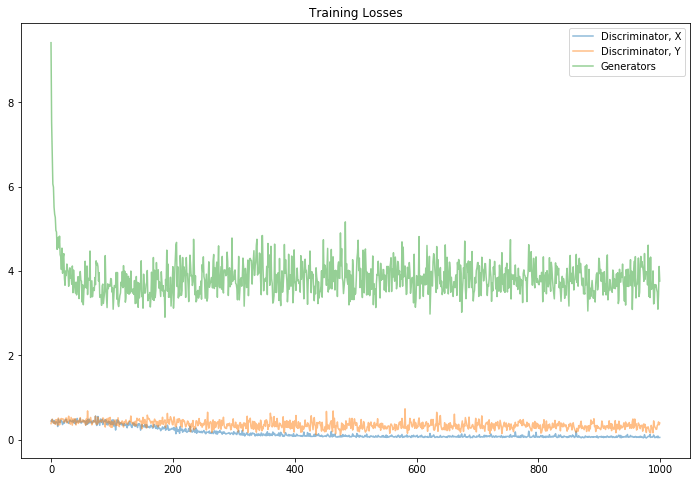

In [23]:
fig, ax = plt.subplots(figsize=(12,8))
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator, X', alpha=0.5)
plt.plot(losses.T[1], label='Discriminator, Y', alpha=0.5)
plt.plot(losses.T[2], label='Generators', alpha=0.5)
plt.title("Training Losses")
plt.legend()

---
## Evaluate the Result

In [24]:
import matplotlib.image as mpimg

# helper visualization code
def view_samples(iteration, sample_dir='samples_cyclegan'):
    
    # samples are named by iteration
    path_XtoY = os.path.join(sample_dir, 'sample-{:06d}-X-Y.png'.format(iteration))
    path_YtoX = os.path.join(sample_dir, 'sample-{:06d}-Y-X.png'.format(iteration))
    
    # read in those samples
    try: 
        x2y = mpimg.imread(path_XtoY)
        y2x = mpimg.imread(path_YtoX)
    except:
        print('Invalid number of iterations.')
    
    fig, (ax1, ax2) = plt.subplots(figsize=(18,20), nrows=2, ncols=1, sharey=True, sharex=True)
    ax1.imshow(x2y)
    ax1.set_title(f'Painting => Real, after {iteration} iterations')
    ax2.imshow(y2x)
    ax2.set_title(f'Real => Painting, after {iteration} iterations')


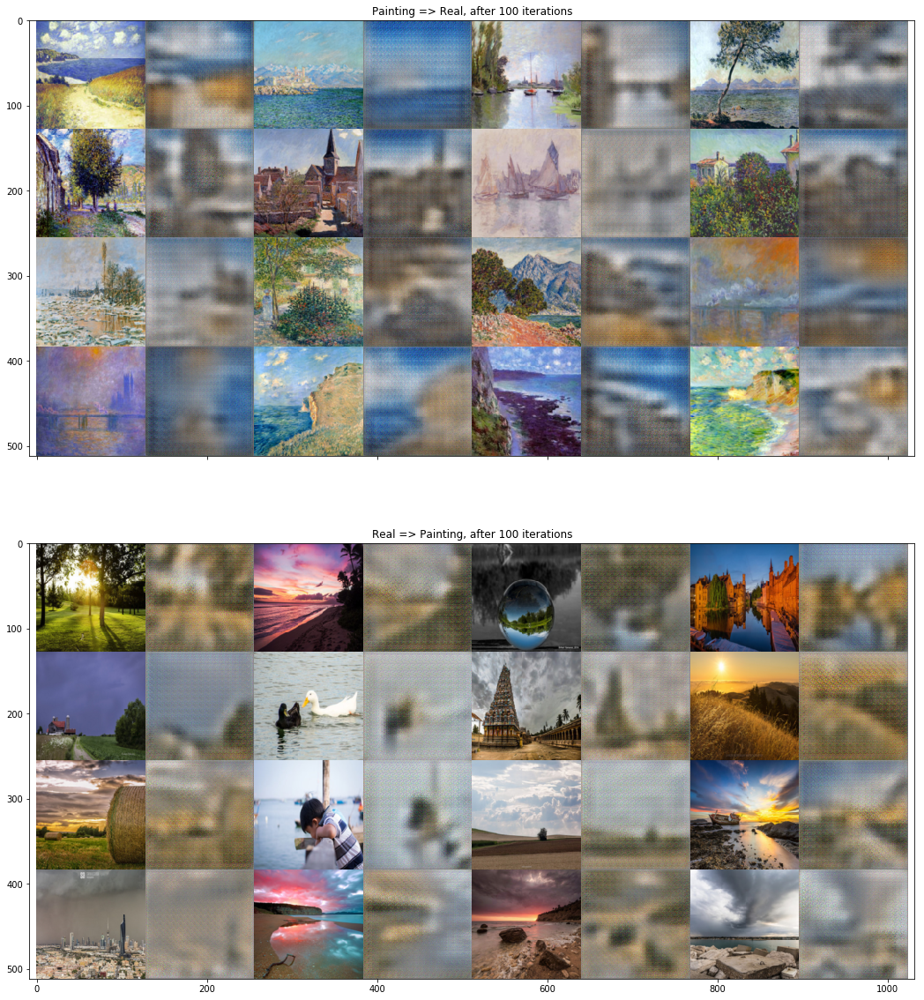

In [25]:
view_samples(100, 'samples_cyclegan')

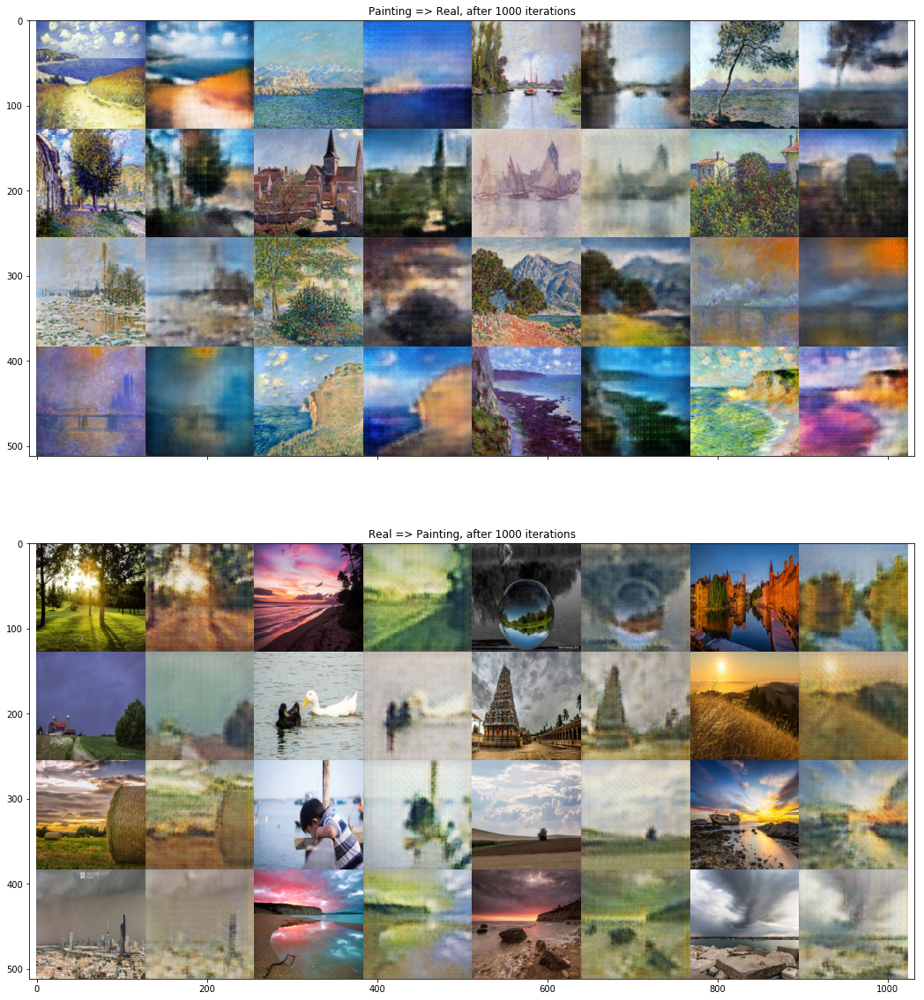

In [26]:
view_samples(1000, 'samples_cyclegan')

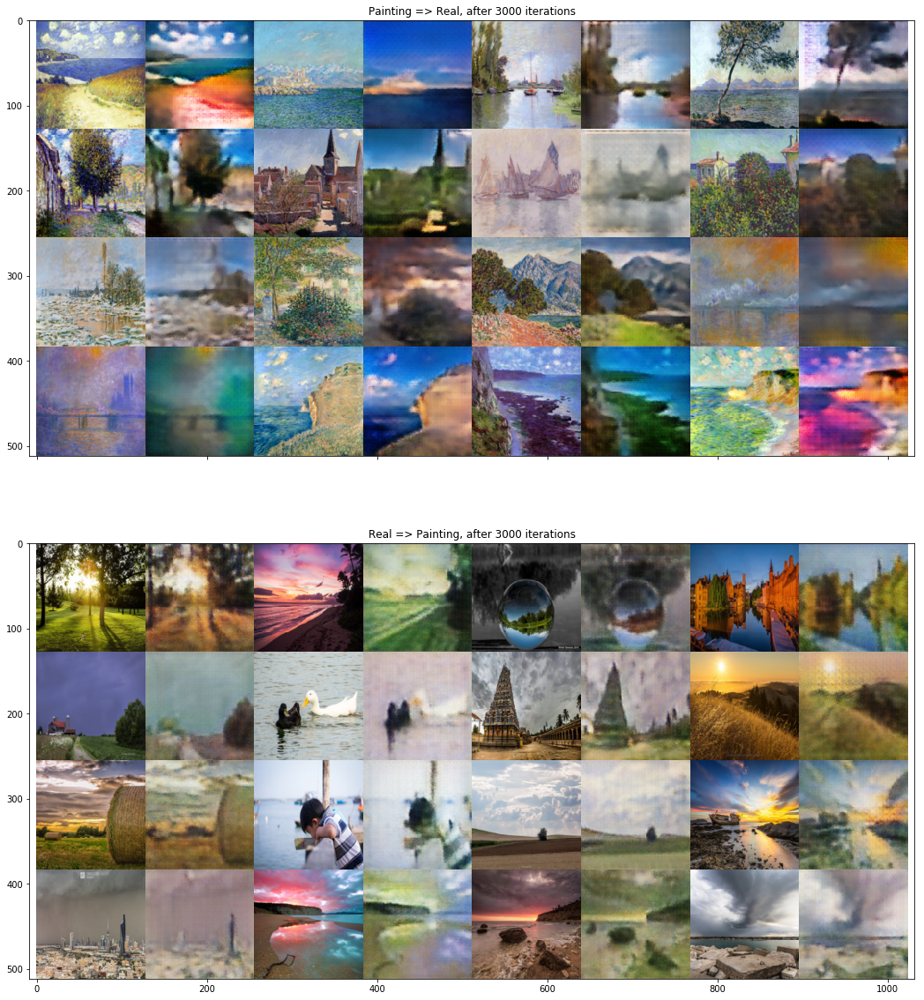

In [27]:
view_samples(3000, 'samples_cyclegan')

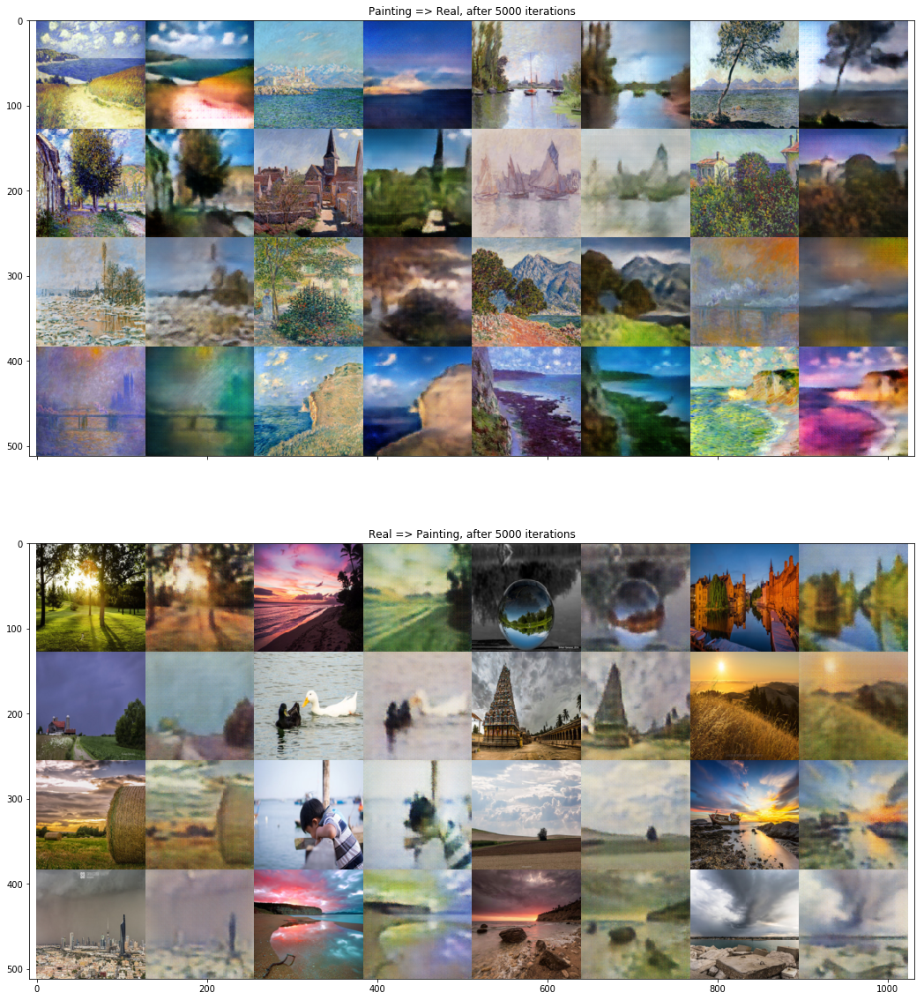

In [28]:
view_samples(5000, 'samples_cyclegan')

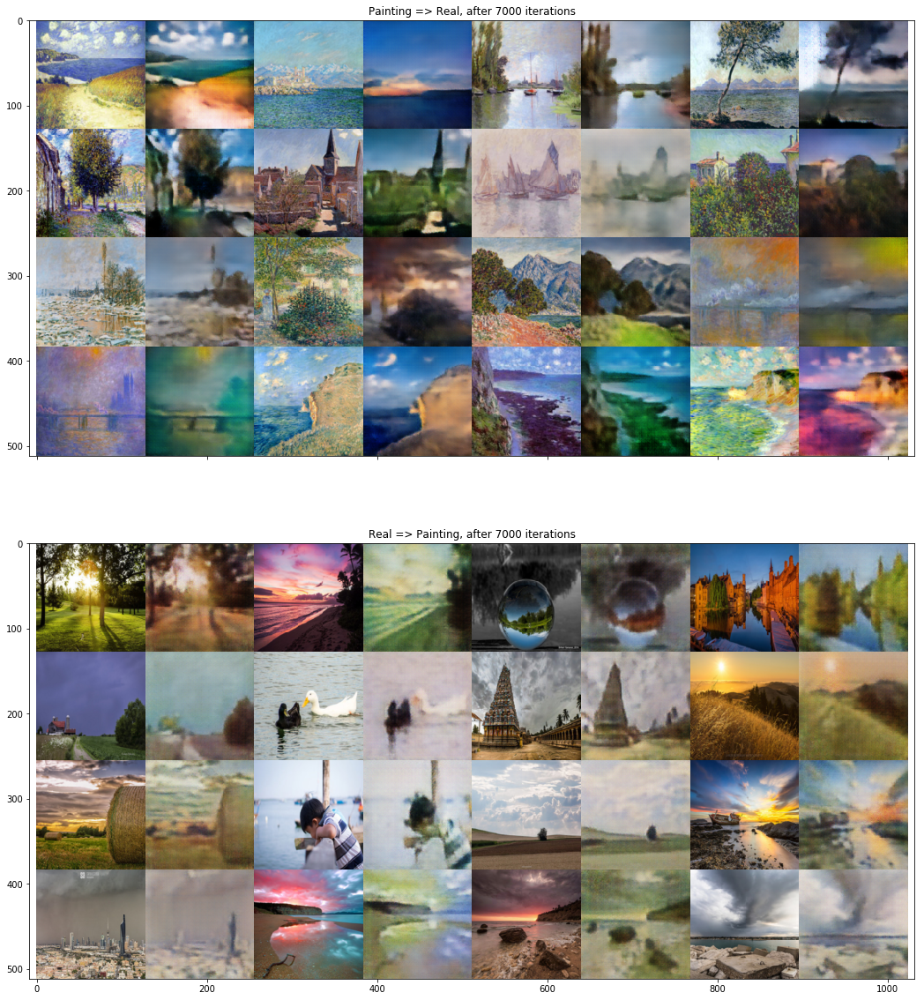

In [29]:
view_samples(7000, 'samples_cyclegan')

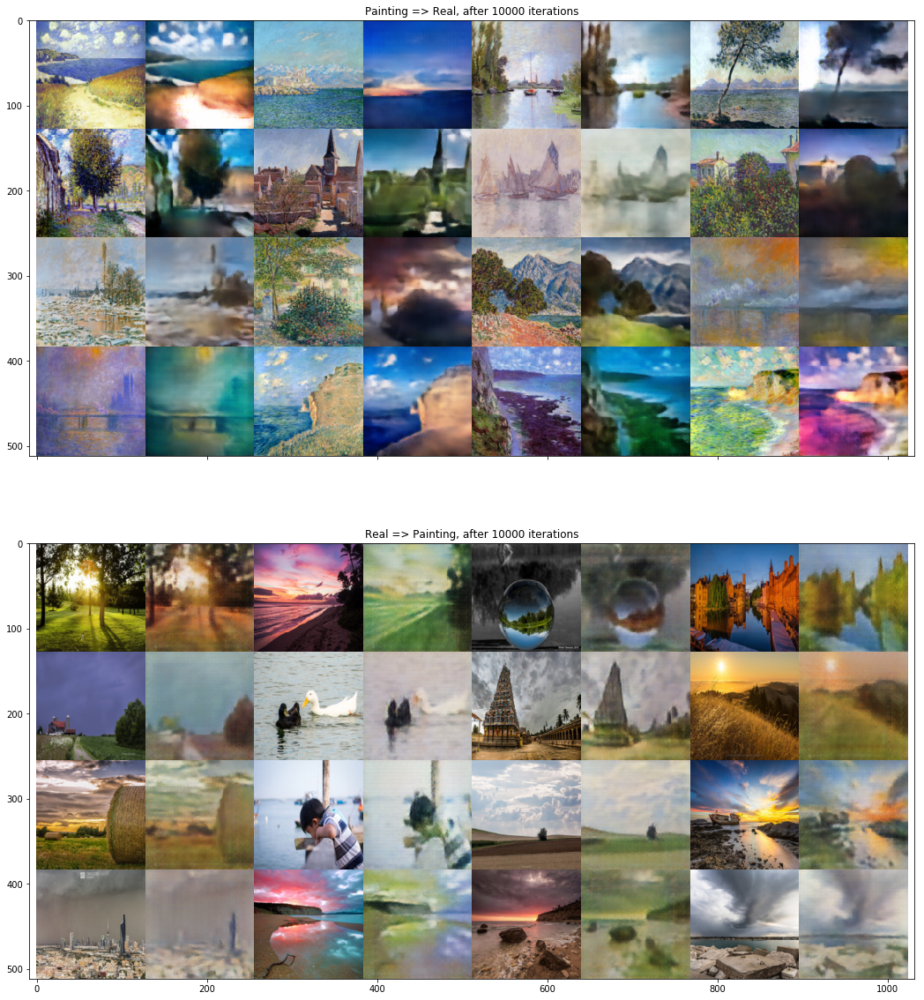

In [30]:
view_samples(10000, 'samples_cyclegan')